In [1]:
import torch
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt 
import numpy as np 
import math
from PIL import Image 
import copy 

In [2]:
%matplotlib inline

In [26]:
path_best_model = "VDK_objet_model.pth"
n_classes = 5
batch_size = 1
n_epochs = 2
pourcentage = 0.05
patch_size = int(math.sqrt(224*224*pourcentage))
targetclass = 1

In [4]:
model = torchvision.models.alexnet(pretrained=True)
model.classifier[6] = torch.nn.Linear(model.classifier[6].in_features, n_classes)
model.load_state_dict(torch.load(path_best_model))

c:\Python39\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Python39\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

In [27]:
path_train_dataset = "C:\\Users\\dell\\Desktop\\proj 3A\\new-fruit\\train"

train_dataset =  torchvision.datasets.ImageFolder(
    path_train_dataset,
    torchvision.transforms.Compose([
        torchvision.transforms.ToTensor(),
        torchvision.transforms.ColorJitter(0.1, 0.1, 0.1, 0.1),
        # torchvision.transforms.Resize((256, 256)),
        # torchvision.transforms.CenterCrop((224,224)),
        torchvision.transforms.Resize(256),
        torchvision.transforms.CenterCrop(224),
        
        # torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
)

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
)


In [21]:
path_test_dataset = "C:\\Users\\dell\\Desktop\\proj 3A\\new-fruit\\val"

test_dataset =  torchvision.datasets.ImageFolder(
    path_test_dataset,
    torchvision.transforms.Compose([
        torchvision.transforms.ColorJitter(0.1, 0.1, 0.1, 0.1),
        torchvision.transforms.Resize((256, 256)),
        torchvision.transforms.CenterCrop((224, 224)),
        torchvision.transforms.ToTensor(),
        # torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
)

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=True,
)


In [2]:
# not in model 

"""
for images , label in train_loader:
    print(model(images))
    print(int(torch.argmax(model(images))))
    print (images.shape)
    images = torch.squeeze(images)
    x= images.numpy()
    y = np.transpose ( x , (1,2,0))
    # y = x.reshape([224,224,3])
    print(y.shape)
    plt.imshow(y)
    plt.show()
    break
"""

'\nfor images , label in train_loader:\n    print(model(images))\n    print(int(torch.argmax(model(images))))\n    print (images.shape)\n    images = torch.squeeze(images)\n    x= images.numpy()\n    y = np.transpose ( x , (1,2,0))\n    # y = x.reshape([224,224,3])\n    print(y.shape)\n    plt.imshow(y)\n    plt.show()\n    break\n'

In [28]:
#functions
Mypatch = torch.rand(1, 3, patch_size, patch_size)

def tensorToArray(tensor):
    array = torch.squeeze(tensor).detach().numpy()
    return np.transpose ( array , (1,2,0))

def extract_patch(image , a , b):
    blankCanva = torch.zeros(1, 3, 224  , 224)
    my_patch = torch.clone(image[0, : , a:a + patch_size , b: b + patch_size])
    # my_patch.requires_grad = True
    my_patch = my_patch[None, :, :, :]
    blankCanva[0, : , a:a + patch_size , b: b + patch_size] = my_patch
    # print(image)
    # plt.imshow(tensorToArray(blankCanva))
    plt.imshow(tensorToArray(my_patch))
    plt.show()
    return my_patch

def get_probability(image,model, targetclass):
    image_out = torch.nn.functional.softmax(model(image), dim=1)
    target_probability = image_out.data[0][targetclass]
    print(float(target_probability))
    return float(target_probability)


def normalizeImage(images):
    print("After normalization")
    print(images.shape)
    imgTensor = torchvision.transforms.ToTensor()(tensorToArray(images))
    transform = torchvision.transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    # print(imgTensor.shape)
    normalized_imgTensor = transform(imgTensor)

    # print(normalized_imgTensor.shape)
    normalized_img = normalized_imgTensor[None, :, :, :]
    # print(normalized_img.shape)
    
    print(model(normalized_img))
    print(int(torch.argmax(model(normalized_img))))
    print (normalized_img.shape)
    plt.imshow(tensorToArray(normalized_img))
    # plt.show()
    return normalized_img

def show_Image(images):
    plt.imshow(tensorToArray(images))
    plt.show()

def normalizeTranf(images):
    transfo = torchvision.transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    normalizedImage = transfo(images)
    return normalizedImage


def evaluate_Img(images, model):
    print(model(images))
    print(int(torch.argmax(model(images))))

In [1]:
#----?
"""

for images , label in train_loader:
    print("before normalization")
    evaluate_Img(images, model)
    print(images.shape)
    show_Image(images)

    print("after normalization")
    normalizedPic= normalizeTranf(images)
    evaluate_Img(normalizedPic, model)
    show_Image(normalizedPic) 

    break

"""

'\n\nfor images , label in train_loader:\n    print("before normalization")\n    evaluate_Img(images, model)\n    print(images.shape)\n    show_Image(images)\n\n    print("after normalization")\n    normalizedPic= normalizeTranf(images)\n    evaluate_Img(normalizedPic, model)\n    show_Image(normalizedPic) \n\n    break\n\n'

tensor([[-0.5019, -0.1257,  1.9398,  0.0321, -0.3590]],
       grad_fn=<AddmmBackward0>)
2


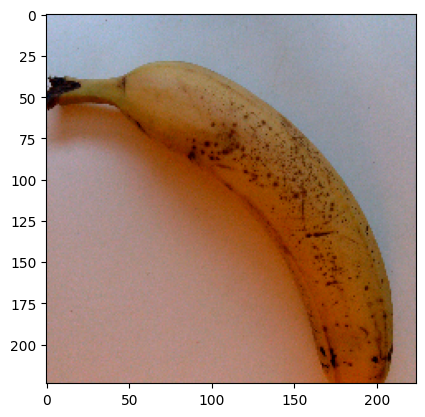

probability
0.0985669493675232


In [119]:
"""
for test_image , label in train_loader:

    evaluate_Img(test_image , model)

    show_Image(test_image )
        

    print("probability")
    get_probability(test_image,model, targetclass)
    break



"""

tensor([[-0.2205, -0.5028,  1.9919,  0.2950, -0.7977]],
       grad_fn=<AddmmBackward0>)
2


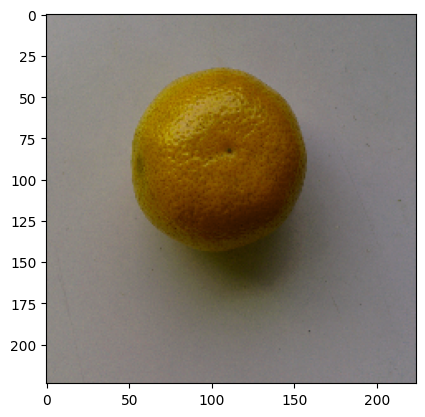

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[ 0.0072, -0.1466,  0.6428,  0.3082, -0.1101]],
       grad_fn=<AddmmBackward0>)
2


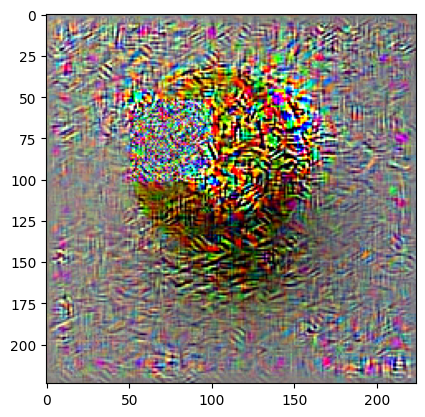

tensor([[ 2.4165, -0.0613, -0.7796, -0.5931, -1.2614]],
       grad_fn=<AddmmBackward0>)
0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


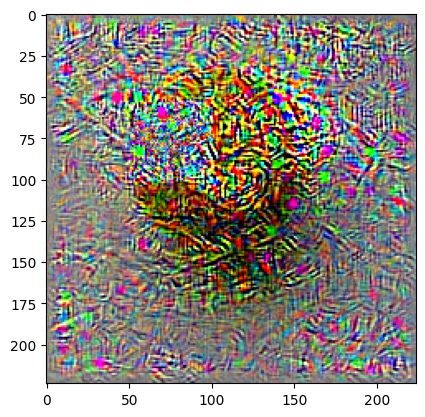

tensor([[-0.3570,  0.1526,  0.4824,  0.3496, -0.6338]],
       grad_fn=<AddmmBackward0>)
0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


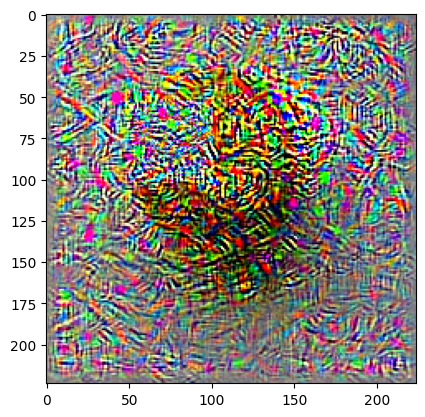

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[-0.8326,  1.5228, -0.1070,  0.9341, -1.4199]],
       grad_fn=<AddmmBackward0>)
1


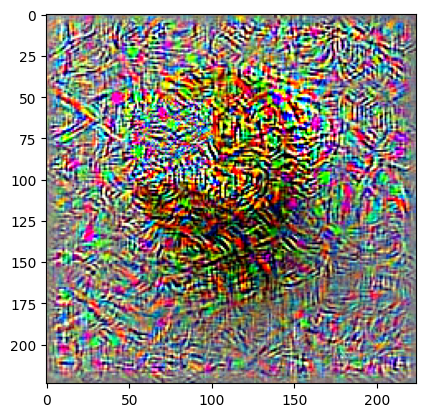

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[-0.3584,  2.3054, -0.7317,  0.1542, -1.3373]],
       grad_fn=<AddmmBackward0>)
1


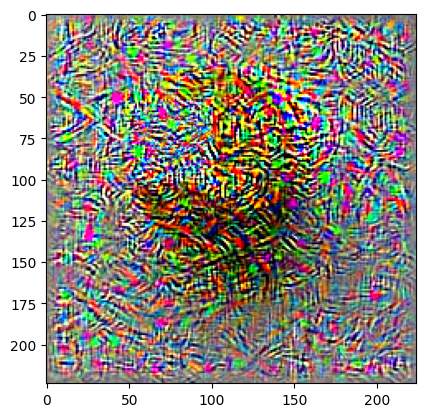

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[-1.1177,  4.4655, -1.0304,  0.5131, -1.6673]],
       grad_fn=<AddmmBackward0>)
1


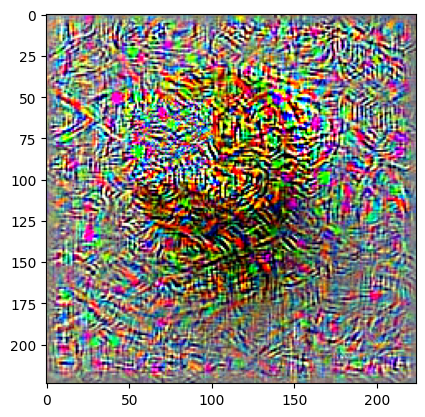

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[-0.6687,  2.8093, -0.7401,  0.1574, -0.8989]],
       grad_fn=<AddmmBackward0>)
1


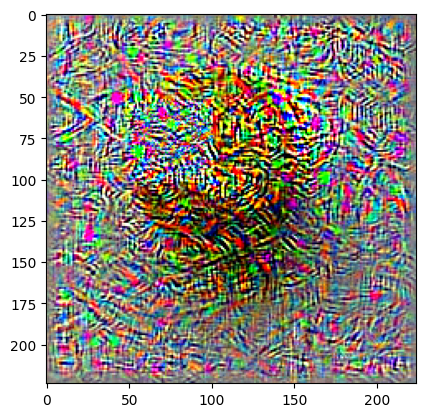

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[-0.3235,  3.1426, -1.5251, -0.0495, -2.2496]],
       grad_fn=<AddmmBackward0>)
1


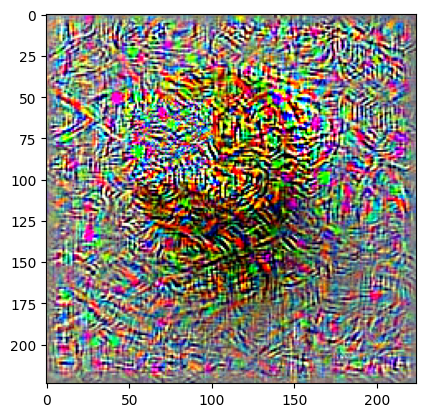

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[-0.4089,  2.4684, -1.3319, -0.0576, -1.0181]],
       grad_fn=<AddmmBackward0>)
1


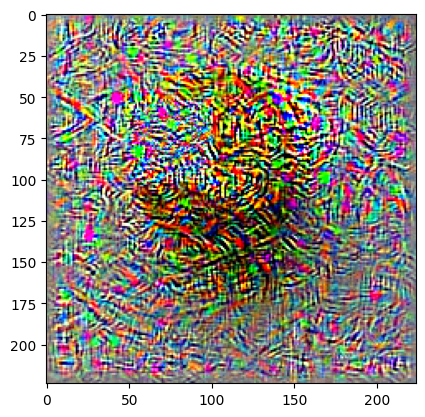

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[-2.0891,  5.2397, -0.4917, -1.1044, -1.7176]],
       grad_fn=<AddmmBackward0>)
1


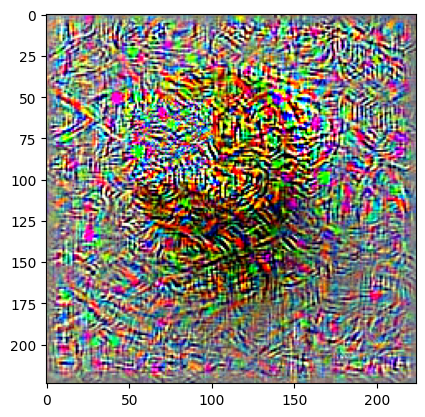

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


the patch


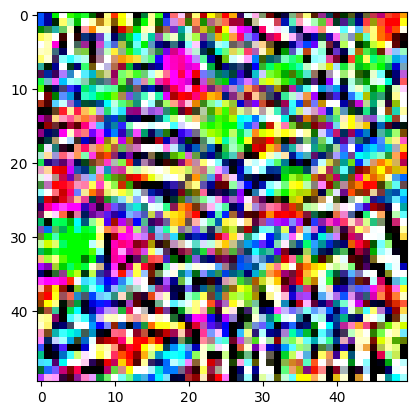

probability
0.7820431590080261


In [69]:
#Pas dans model v0 generer PAtch

"""

patch = torch.rand(1, 3, patch_size, patch_size)


for image , label in train_loader:
    evaluate_Img(image , model)

    a = np.random.randint(0,224-patch_size)
    b = np.random.randint(0,224-patch_size)
    show_Image(image)
    
    
    
    image[0, : , a:a + patch_size , b: b + patch_size] = patch

    image.requires_grad = True

    for i in range(10):
        vecteurScore = model(image) 
        
        loss = -torch.nn.functional.log_softmax(vecteurScore, dim = 1)
        loss[0, targetclass].backward()
        with torch.no_grad() : 
            image -= 100*image.grad
        image.grad.zero_()

        evaluate_Img(image ,model)
        show_Image(image)

        
    print("the patch")
    patch = extract_patch(image , a , b)
    

    print("probability")
    get_probability(image,model, targetclass)
    break



"""

*LE PATCH*


In [4]:


#generer PAtch  
Mypatch = torch.rand(1, 3, patch_size, patch_size)


for image , label in train_loader:

    # a = np.random.randint(0,224-patch_size)
    # b = np.random.randint(0,224-patch_size)
    a = 10
    b = 10

    print("original image")
    show_Image(image)
    
    
    image[0, : , a:a + patch_size , b: b + patch_size] = Mypatch
    image.requires_grad = True

    transfo = torchvision.transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    normalizedImage = transfo(image)

    print(" image + patch both normalized ")

    show_Image(image)


    for i in range(10):
        
        with torch.no_grad() : 
            image[0, : , a:a + patch_size , b: b + patch_size] = Mypatch
        normalizedImage = transfo(image)
        Normalized_vecteurScore = model(normalizedImage)


        loss_normalized = -torch.nn.functional.log_softmax(Normalized_vecteurScore, dim = 1)
        loss_normalized[0, targetclass].backward()

        image_copy = image.clone().detach()


        print(image.requires_grad)

        image_copy -= 100*image.grad

        image.grad.zero_()



        print("image copy")
        print(model(image_copy))
        print(int(torch.argmax(model(image_copy))))

        print("normalized")
        print(model(normalizedImage))
        print(int(torch.argmax(model(normalizedImage))))

        
        print("the patch non normalized")
        Mypatch_test = extract_patch(image , a , b)
        Mypatch = extract_patch(image_copy , a , b)
        show_Image(image_copy)

    

    print("probability")
    get_probability(image,model, targetclass)
    get_probability(normalizedImage,model, targetclass)
    break



NameError: name 'torch' is not defined

tensor([[ 5.6211, -4.6134]], grad_fn=<AddmmBackward0>)
0


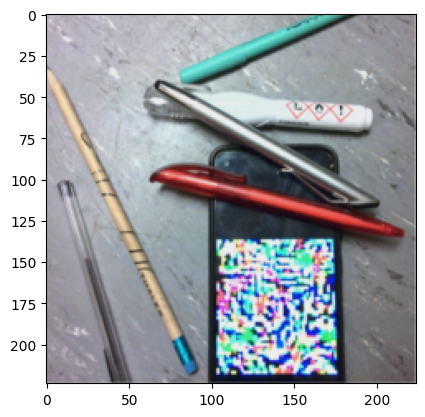

probability
1.3489816410583444e-05
patch applied 


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


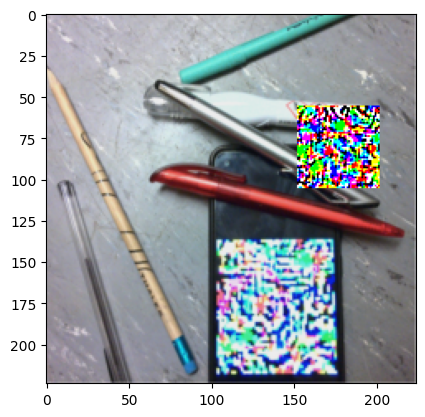

tensor([[-4.5558,  0.5215]], grad_fn=<AddmmBackward0>)
1
0.9942362904548645


In [11]:

#tester Patch 

for test_image , label in test_loader:
    
    print(model(test_image))
    print(int(torch.argmax(model(test_image))))
    
    show_Image(test_image)

    # test_image = normalizeImage(test_image)

    # a = np.random.randint(0,224-patch_size)
    # b = np.random.randint(0,224-patch_size)
        

    print("probability")
    get_probability(test_image,model, targetclass)

    test_image[0, : , a:a + patch_size , b: b + patch_size] = Mypatch
    print("patch applied ")
    # test_image = normalizeTranf(test_image)
    show_Image(test_image)

    print(model(test_image))
    print(int(torch.argmax(model(test_image))))

    # show_Image(Mypatch)
    get_probability(test_image , model , 1)


    break


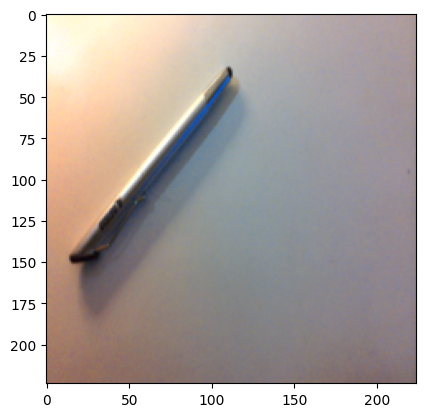

tensor([[ 5.6755, -5.4446]], grad_fn=<AddmmBackward0>)
0
probability
5.5602973588975146e-05


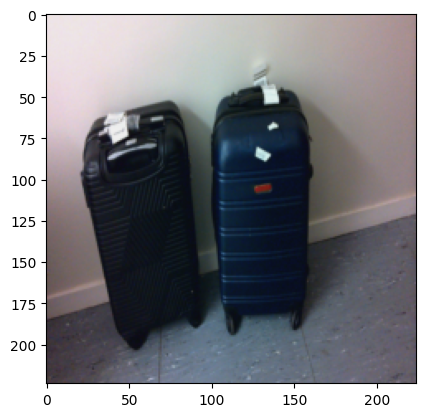

tensor([[-2.0489,  3.0033]], grad_fn=<AddmmBackward0>)
1
probability
0.9989118576049805


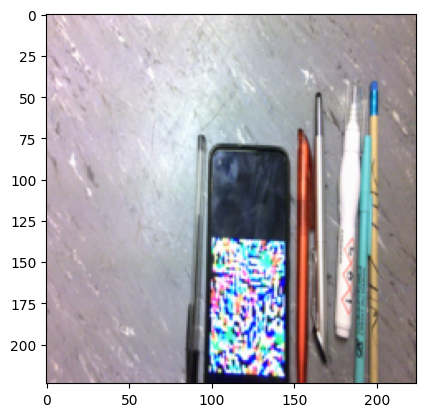

tensor([[ 2.6649, -1.9071]], grad_fn=<AddmmBackward0>)
0
probability
0.006567555014044046


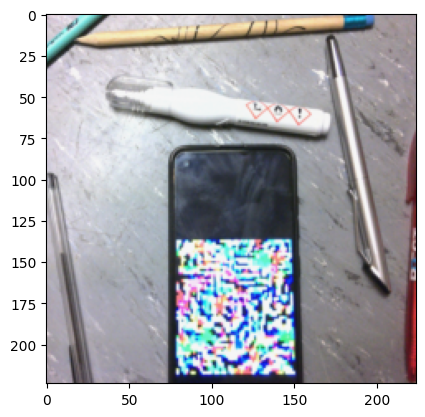

tensor([[ 1.7676, -1.3470]], grad_fn=<AddmmBackward0>)
0
probability
0.049185242503881454


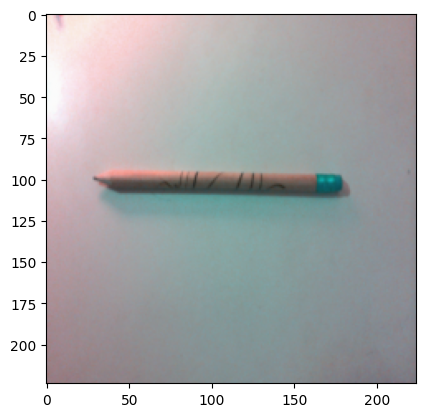

tensor([[ 6.3217, -6.1754]], grad_fn=<AddmmBackward0>)
0
probability
7.032317080302164e-05


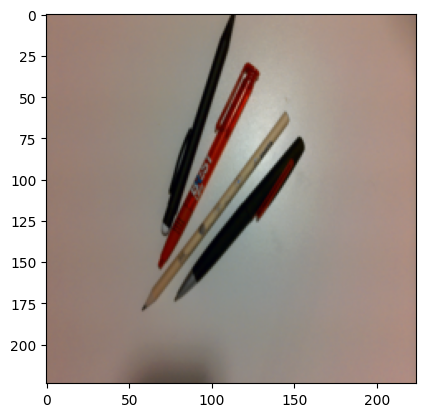

tensor([[ 9.4835, -9.6705]], grad_fn=<AddmmBackward0>)
0
probability
1.3587925451474803e-08


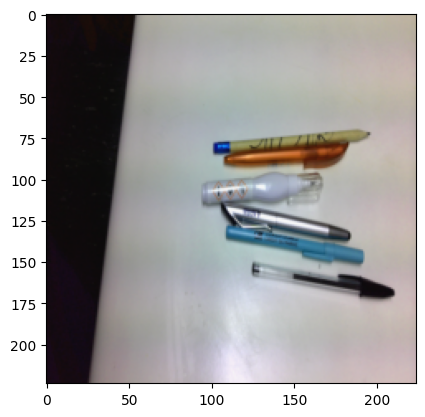

tensor([[ 5.2269, -4.3901]], grad_fn=<AddmmBackward0>)
0
probability
0.00013110952568240464


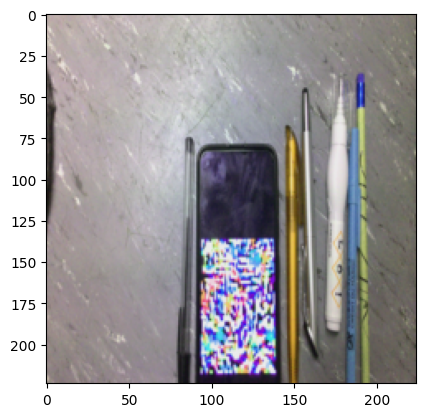

tensor([[ 2.3763, -2.0058]], grad_fn=<AddmmBackward0>)
0
probability
0.07213125377893448


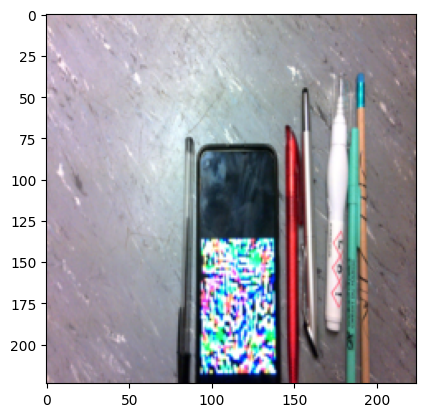

tensor([[ 1.9679, -1.5372]], grad_fn=<AddmmBackward0>)
0
probability
0.02318716049194336


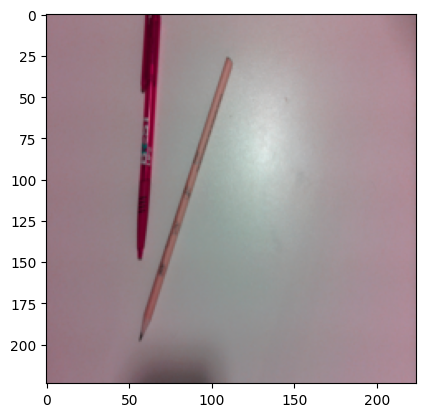

tensor([[ 7.2912, -6.7210]], grad_fn=<AddmmBackward0>)
0
probability
7.561216534668347e-06


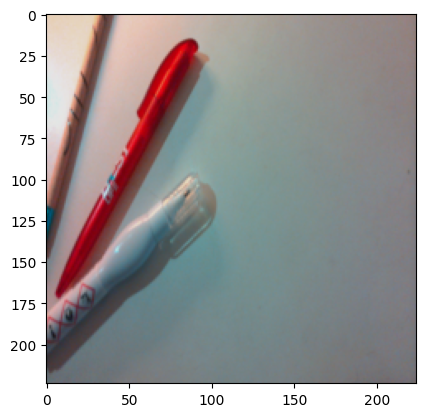

tensor([[ 8.6058, -8.1586]], grad_fn=<AddmmBackward0>)
0
probability
1.849641921580769e-05


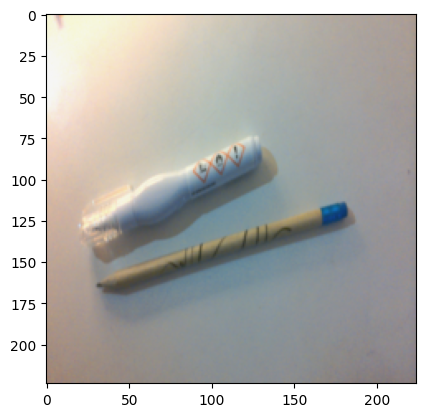

tensor([[ 6.6828, -6.4668]], grad_fn=<AddmmBackward0>)
0
probability
8.411814178543864e-07


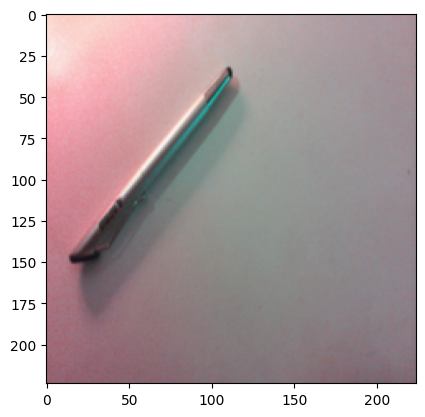

tensor([[ 5.4831, -5.4617]], grad_fn=<AddmmBackward0>)
0
probability
2.168554419768043e-05


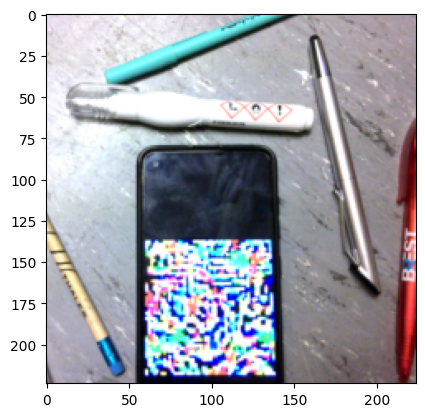

tensor([[ 2.7549, -3.9253]], grad_fn=<AddmmBackward0>)
0
probability
0.011309957131743431


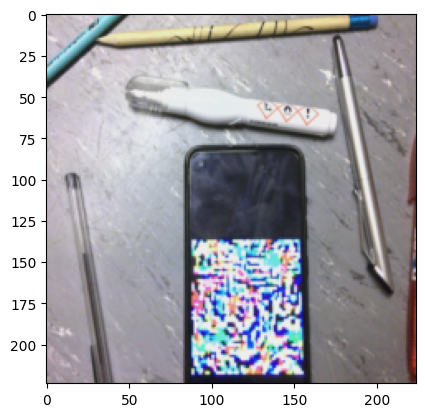

tensor([[ 1.8422, -1.1039]], grad_fn=<AddmmBackward0>)
0
probability
0.09278063476085663


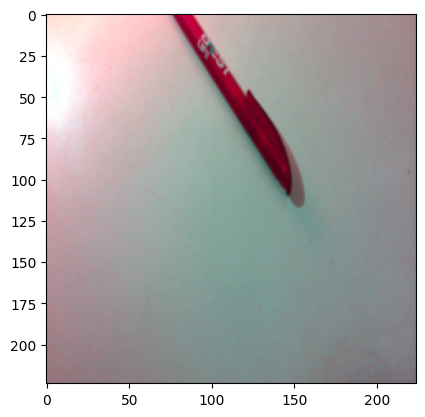

tensor([[ 7.4889, -7.6798]], grad_fn=<AddmmBackward0>)
0
probability
6.889246861874199e-08


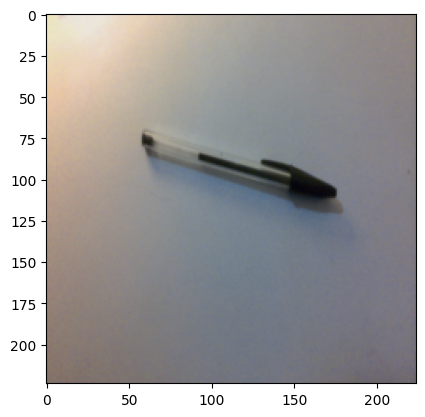

tensor([[ 6.7133, -6.7980]], grad_fn=<AddmmBackward0>)
0
probability
3.6396072573552374e-06


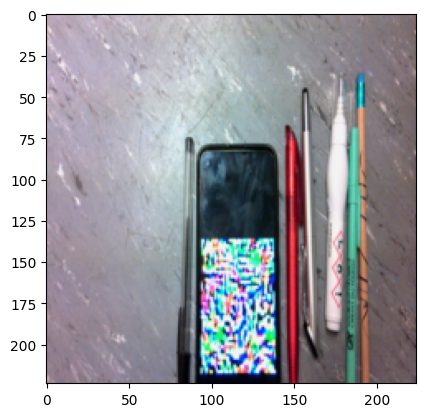

tensor([[ 1.4816, -1.5942]], grad_fn=<AddmmBackward0>)
0
probability
0.004428960848599672


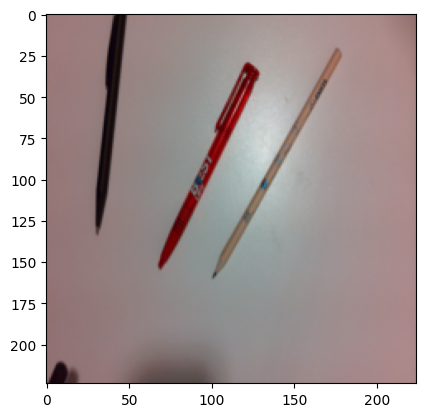

tensor([[ 9.7332, -9.7785]], grad_fn=<AddmmBackward0>)
0
probability
2.0592596516877393e-09


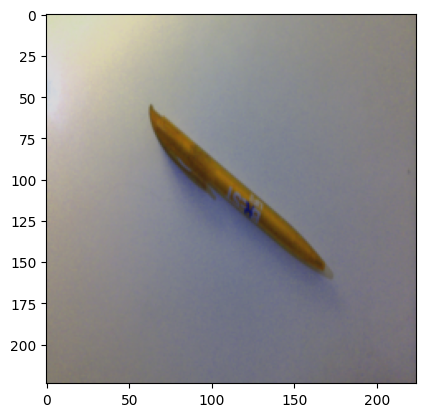

tensor([[ 5.7516, -5.7431]], grad_fn=<AddmmBackward0>)
0
probability
6.788910923205549e-06


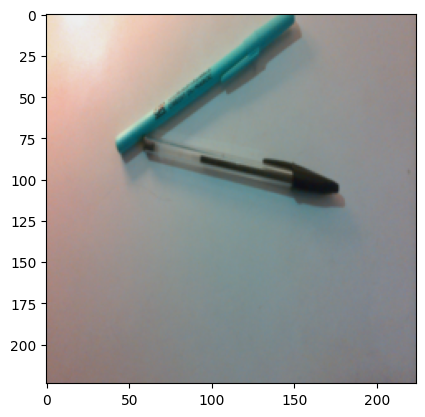

tensor([[ 6.9082, -6.8370]], grad_fn=<AddmmBackward0>)
0
probability
2.0729666871943664e-08


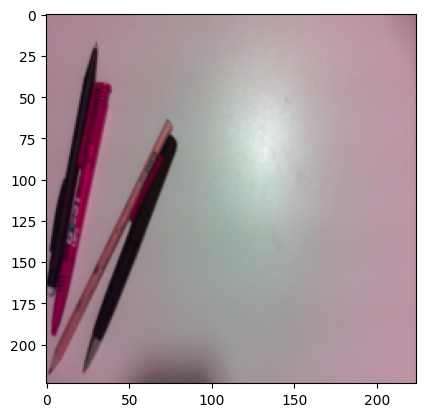

tensor([[ 6.3113, -6.4060]], grad_fn=<AddmmBackward0>)
0
probability
1.0047990173234211e-07


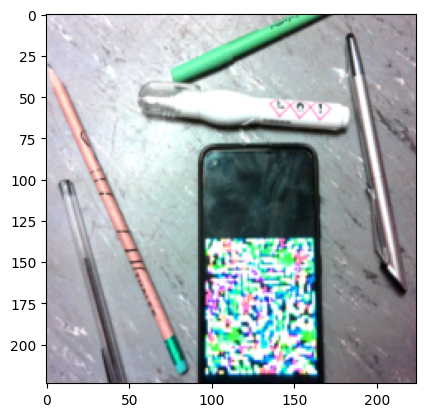

tensor([[ 2.5823, -2.6431]], grad_fn=<AddmmBackward0>)
0
probability
0.0021709795109927654


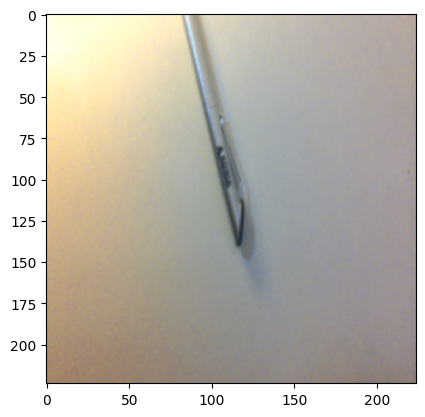

tensor([[ 4.2740, -4.8376]], grad_fn=<AddmmBackward0>)
0
probability
1.7164231394417584e-05


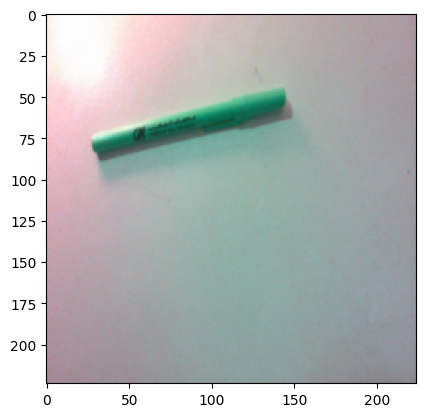

tensor([[ 5.9010, -5.8622]], grad_fn=<AddmmBackward0>)
0
probability
3.2218711112363962e-06


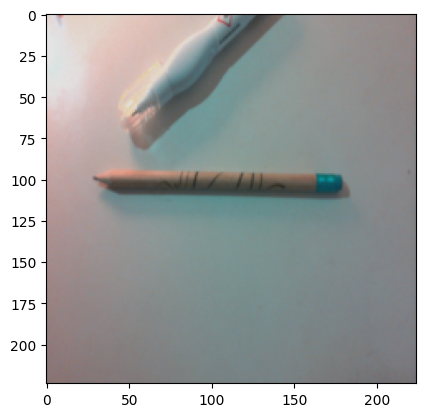

tensor([[ 7.6019, -6.9395]], grad_fn=<AddmmBackward0>)
0
probability
4.052776603202801e-06


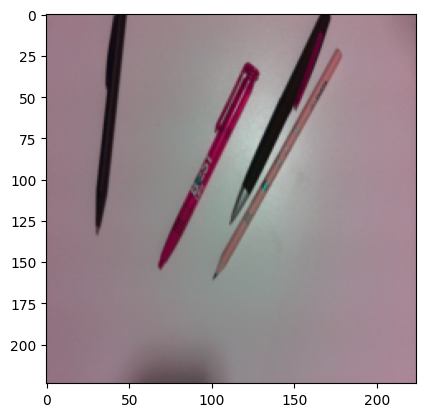

tensor([[ 8.4351, -8.7005]], grad_fn=<AddmmBackward0>)
0
probability
1.8260887912902035e-08


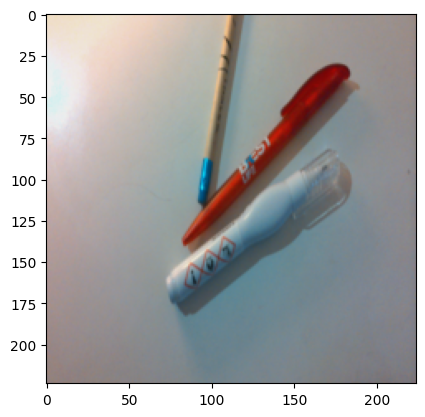

tensor([[ 7.3832, -6.7387]], grad_fn=<AddmmBackward0>)
0
probability
7.228077720355941e-06


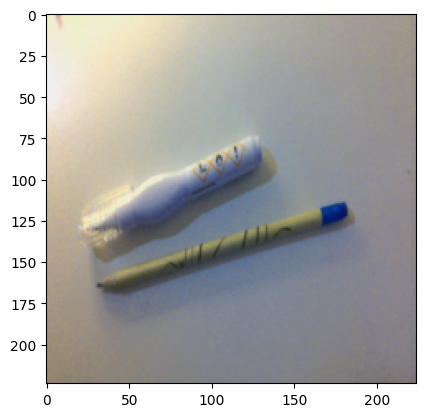

tensor([[ 6.1959, -6.2873]], grad_fn=<AddmmBackward0>)
0
probability
1.8687093472635752e-07


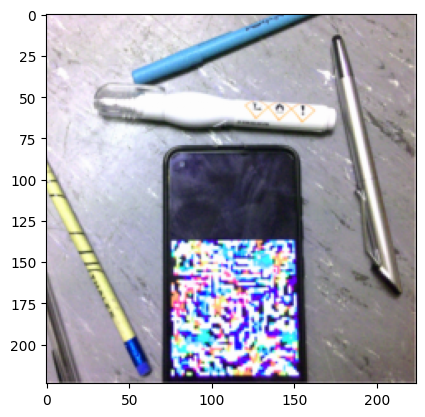

tensor([[ 2.9886, -2.5043]], grad_fn=<AddmmBackward0>)
0
probability
0.006018661428242922


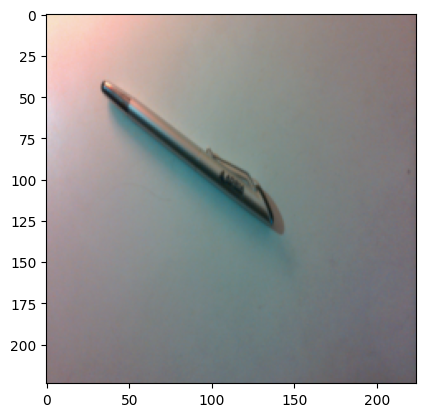

tensor([[ 6.5980, -6.2060]], grad_fn=<AddmmBackward0>)
0
probability
6.192411092342809e-06


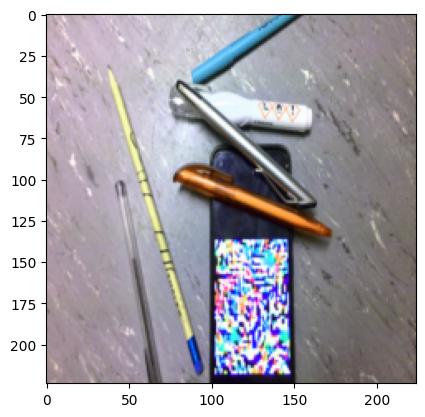

tensor([[ 7.2453, -6.7694]], grad_fn=<AddmmBackward0>)
0
probability
1.3621131074614823e-05


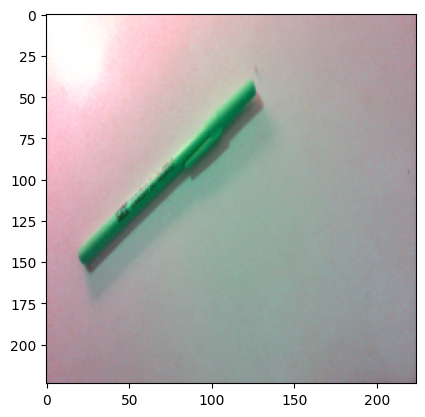

tensor([[ 5.9842, -6.2919]], grad_fn=<AddmmBackward0>)
0
probability
3.5228745787208027e-07


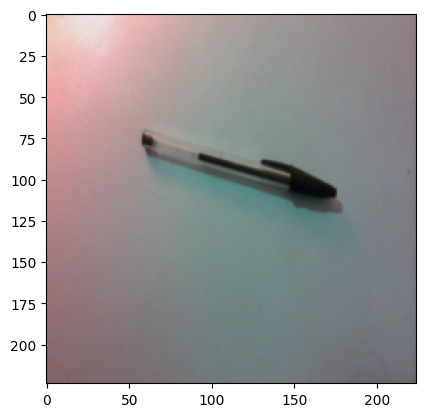

tensor([[ 7.7779, -7.7355]], grad_fn=<AddmmBackward0>)
0
probability
1.3155581655155402e-05


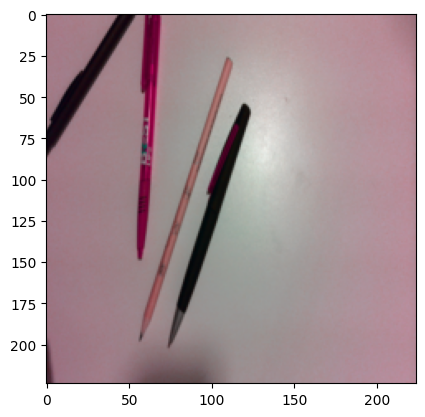

tensor([[ 7.2362, -7.7394]], grad_fn=<AddmmBackward0>)
0
probability
1.4437610218465124e-07


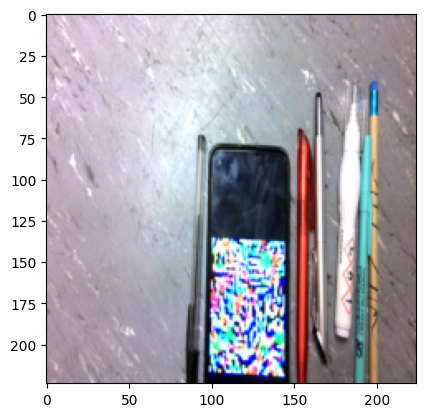

tensor([[ 1.9437, -1.3708]], grad_fn=<AddmmBackward0>)
0
probability
0.016171570867300034


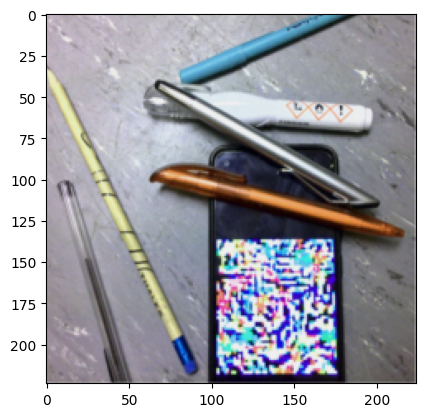

tensor([[ 4.5318, -3.0693]], grad_fn=<AddmmBackward0>)
0
probability
9.781934932107106e-05


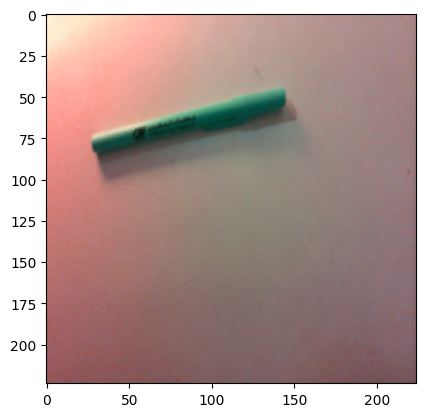

tensor([[ 4.1474, -4.3401]], grad_fn=<AddmmBackward0>)
0
probability
0.00022185573470778763


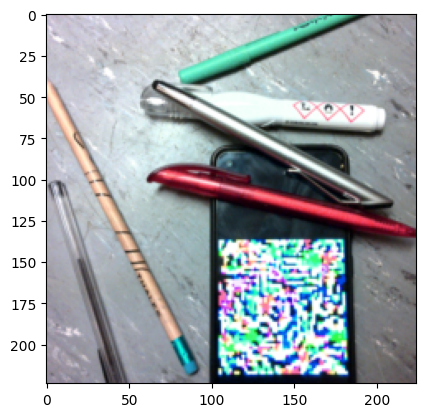

tensor([[ 6.4604, -5.7724]], grad_fn=<AddmmBackward0>)
0
probability
2.842044887074735e-05


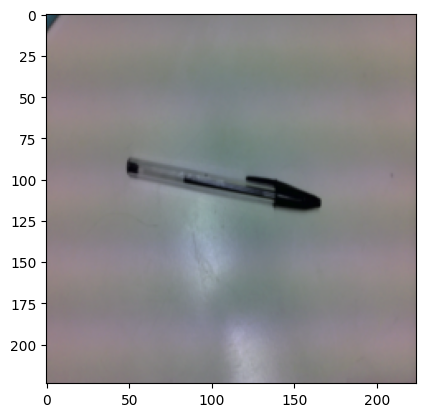

tensor([[ 6.4548, -6.1177]], grad_fn=<AddmmBackward0>)
0
probability
5.888955456612166e-07


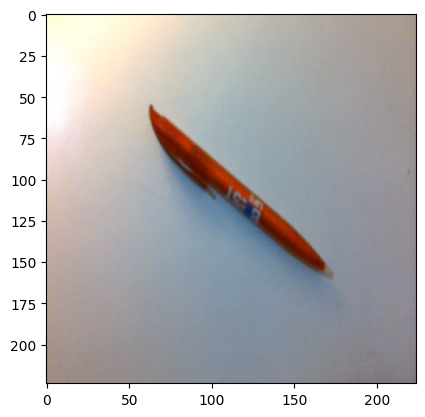

tensor([[ 8.4729, -8.4335]], grad_fn=<AddmmBackward0>)
0
probability
3.666802683710557e-07


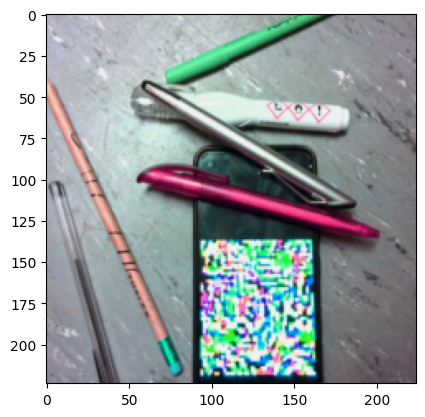

tensor([[ 6.4568, -5.4947]], grad_fn=<AddmmBackward0>)
0
probability
2.4717878659430426e-06


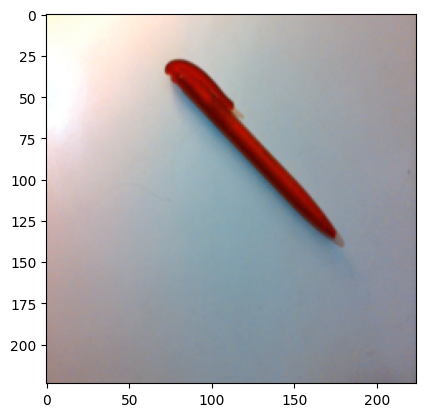

tensor([[ 8.9411, -8.5053]], grad_fn=<AddmmBackward0>)
0
probability
2.4495358630360897e-08


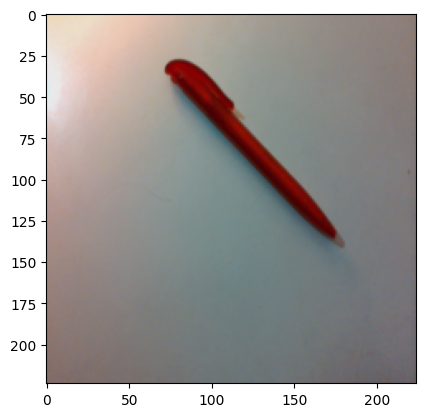

tensor([[ 7.7823, -7.8057]], grad_fn=<AddmmBackward0>)
0
probability
1.842371233351514e-07


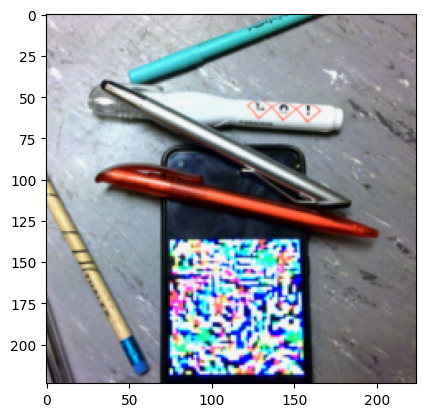

tensor([[ 6.0980, -4.8572]], grad_fn=<AddmmBackward0>)
0
probability
6.829926860518754e-05


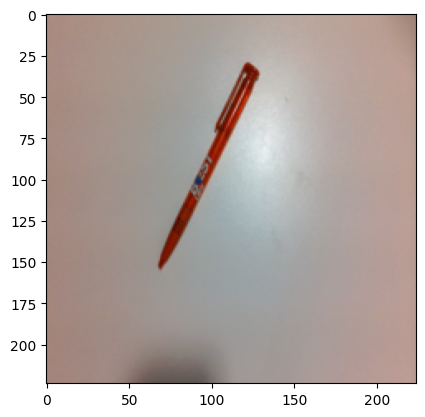

tensor([[ 9.2537, -9.2365]], grad_fn=<AddmmBackward0>)
0
probability
4.4285876299454685e-08


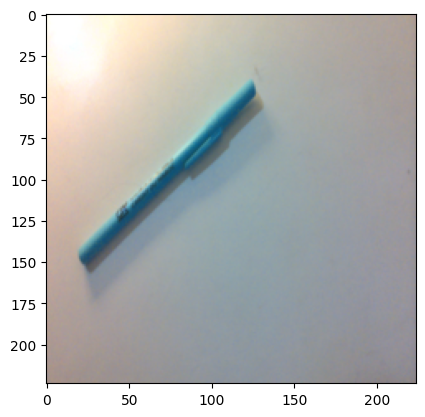

tensor([[ 6.1956, -6.9849]], grad_fn=<AddmmBackward0>)
0
probability
1.503910652900231e-06


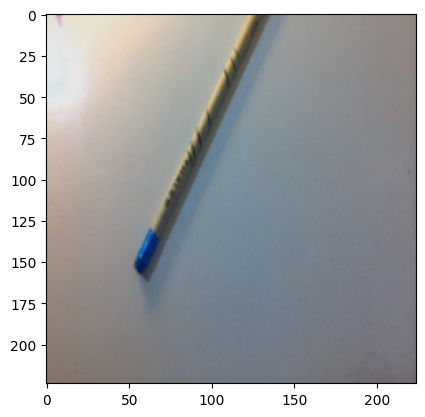

tensor([[ 7.0572, -7.4741]], grad_fn=<AddmmBackward0>)
0
probability
3.9315273170359433e-07


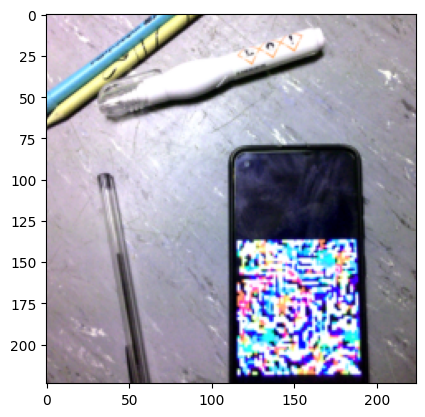

tensor([[ 2.9151, -2.6462]], grad_fn=<AddmmBackward0>)
0
probability
0.0019468358950689435


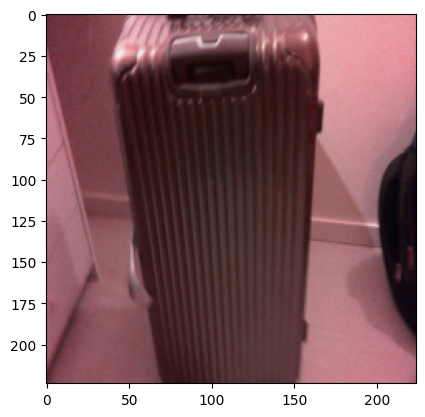

tensor([[-0.5940,  0.4046]], grad_fn=<AddmmBackward0>)
1
probability
0.9715688228607178


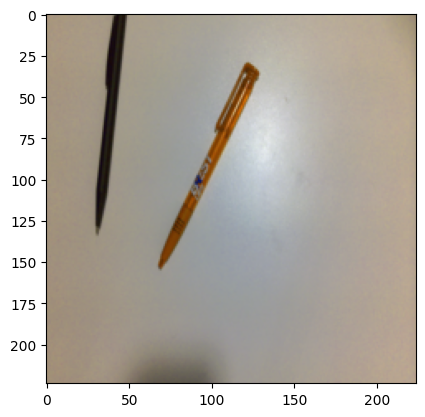

tensor([[ 9.1914, -8.8308]], grad_fn=<AddmmBackward0>)
0
probability
2.527044955513702e-07


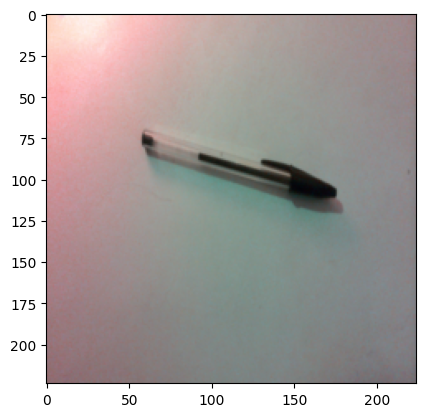

tensor([[ 6.6361, -6.3227]], grad_fn=<AddmmBackward0>)
0
probability
2.7777750801760703e-06


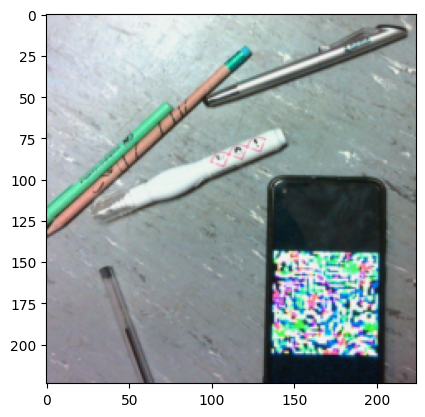

tensor([[ 6.6353, -5.6392]], grad_fn=<AddmmBackward0>)
0
probability
1.3516241779143456e-05


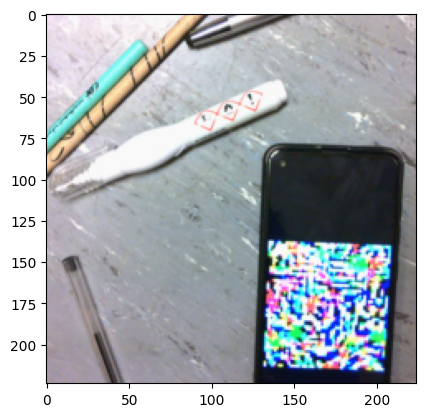

tensor([[ 4.1724, -3.7318]], grad_fn=<AddmmBackward0>)
0
probability
0.0029945564456284046


In [12]:
# test in real life 
for test_image , label in test_loader:
    
    # print(model(test_image))
    # print(int(torch.argmax(model(test_image))))
    

    show_Image(test_image)

    evaluate_Img(test_image, model)

    # test_image = normalizeImage(test_image)

    # a = np.random.randint(0,224-patch_size)
    # b = np.random.randint(0,224-patch_size)
        

    print("probability")
    get_probability(test_image,model, targetclass)


    # test_image[0, : , a:a + patch_size , b: b + patch_size] = Mypatch
    # print("patch applied ")
    # test_image = normalizeTranf(test_image)
    # show_Image(test_image)

    # print(model(test_image))
    # print(int(torch.argmax(model(test_image))))

    # show_Image(Mypatch)
    # get_probability(test_image , model , 1)


    # break